In [1]:
import os
import numpy as np
import matplotlib
# matplotlib.use('Agg')
import matplotlib.pyplot as plt
from scipy.sparse import coo_matrix, csr_matrix
from pyrecode.recode_reader import ReCoDeReader
import pims
import imageio
from numba import njit, jit
import time
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pyrecode.utils.plots import plot_frames
from pyrecode.utils.converters import read_dark_ref
from IPython.display import Image
from IPython.core.display import HTML 
import pims

/usr/local/anaconda3/lib/python3.6/site-packages/numba/errors.py:131: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


In [4]:
_data_folder = '/scratch/loh/abhik/23-Jan-2020/nano_cluster'
_tag = 'gold_nano_1k_1k'
intermediate_file_name = os.path.join(_data_folder, _tag + '.rc1_part000')

reader = ReCoDeReader(intermediate_file_name, is_intermediate=True)
reader.open()
frames = {}
nz = reader._get_shape()[0]
nx = reader._get_shape()[1]
ny = reader._get_shape()[2]
for i in range(5):
    d = reader._get_next_frame()
    print(d)
    frames.update(d)
reader.close()

uid = 255
version_major = 0
version_minor = 1
reduction_level = 1
recode_operation_mode = 1
bit_depth = 12
nx = 1024
ny = 1024
nz = 3001
L2_statistics = 0
L4_centroiding = 0
compression_scheme = 0
compression_level = 1
source_file_type = 2
source_header_length = 0
source_header_position = 1
source_file_name = gold_nano_1k_1k                                                                                     
dark_file_name = _dark_ref_2.bin                                                                                     
dark_threshold_epsilon = 20
has_dark_data = 1
frame_offset = 0
dark_frame_offset = 0
num_dark_frames = 1
source_bit_depth = 12
checksum = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
futures = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
{0: <1024x1024 sparse matrix of type '<class 'numpy.uint16'>'
	with 172647 stored elements in COOrdinate format>}
{1: <1024x1024 sparse matrix of type '<class 'numpy

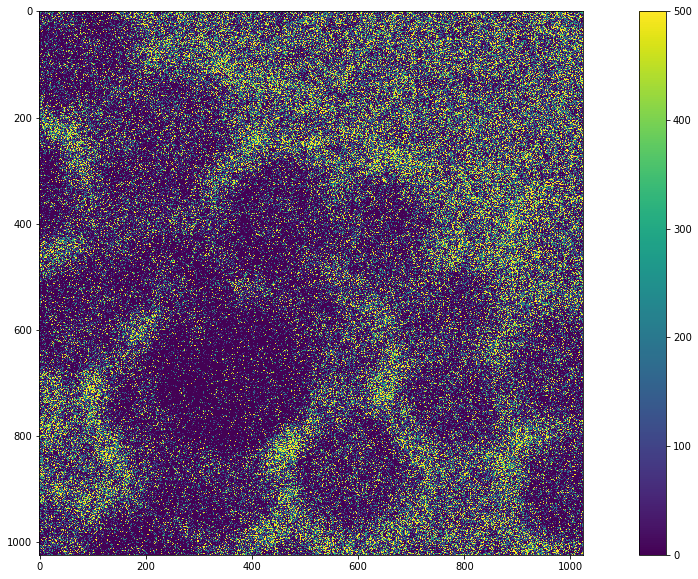

In [5]:
view = np.zeros((nx,ny))
for index, frame_id in enumerate(frames):
    a = frames[frame_id].toarray()
    view = np.add(view, a)
    if index == 5:
        break
fig, ax = plt.subplots(figsize=(20,10))
im = ax.imshow(view, vmax=500)
fig.colorbar(im)
plt.show()

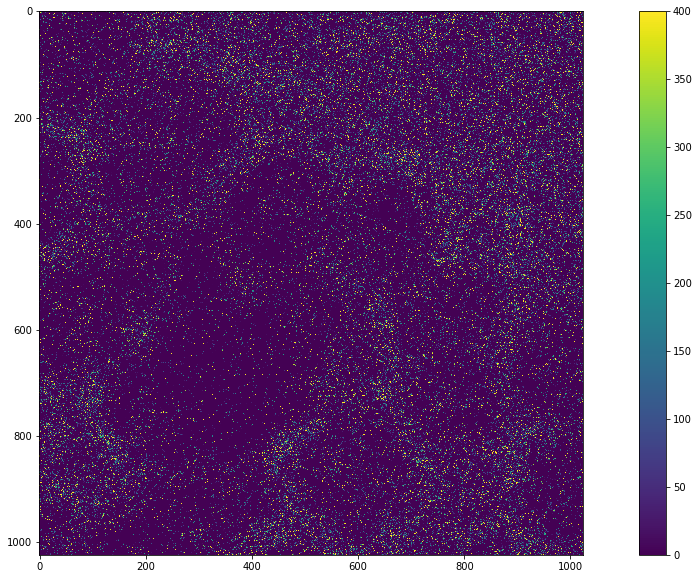

0 29234033


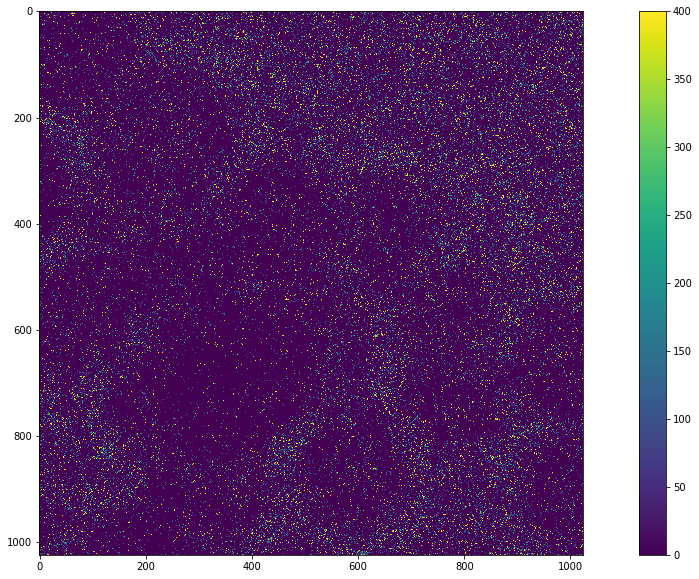

1 28858996


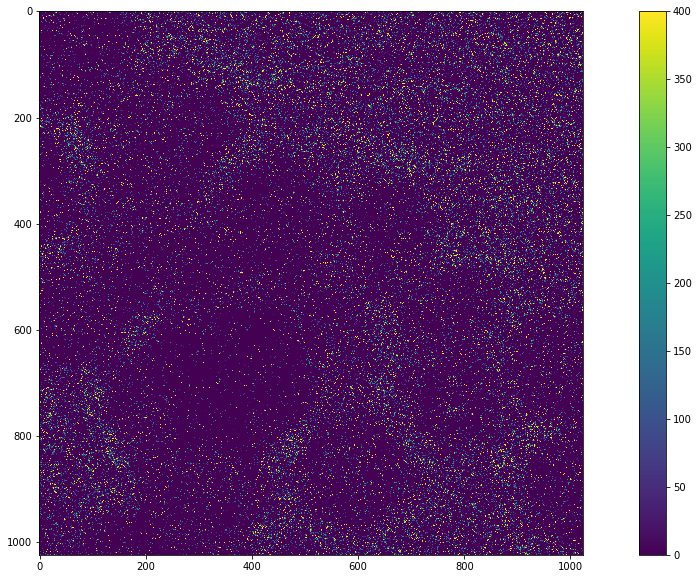

2 28949047


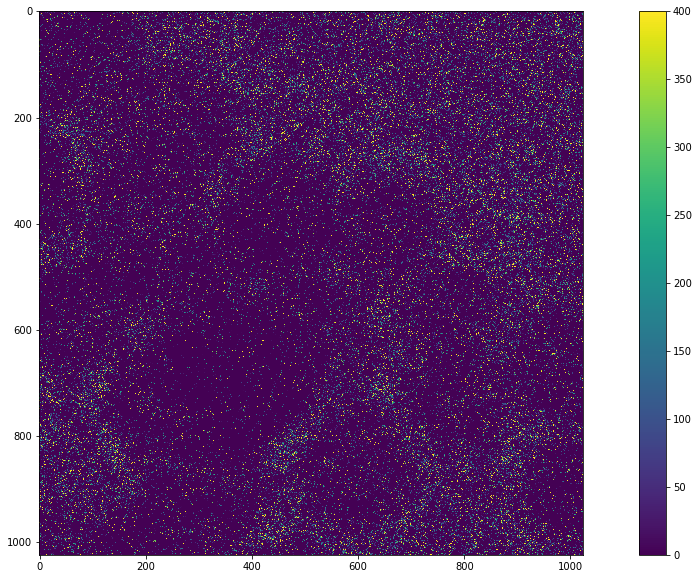

3 29060757


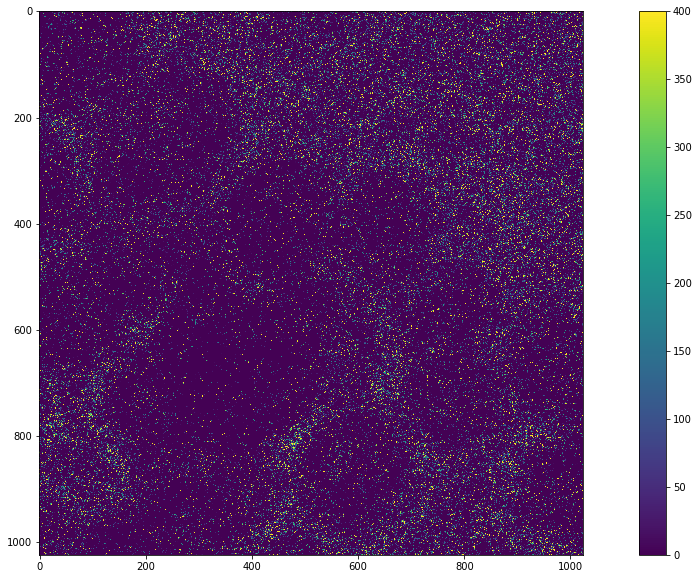

4 29033167


In [3]:
for index, frame_id in enumerate(frames):
    a = frames[frame_id].toarray()
    fig, ax = plt.subplots(figsize=(20,10))
    im = ax.imshow(a, vmax=400)
    fig.colorbar(im)
    plt.show()
    print(str(index), str(np.sum(a)))
    if index == 5:
        break

In [4]:
v = np.arange(21)
d = np.reshape(v, [7,3])
print(d)

[[ 0  1  2]
 [ 3  4  5]
 [ 6  7  8]
 [ 9 10 11]
 [12 13 14]
 [15 16 17]
 [18 19 20]]


In [13]:
# _data_folder = '/scratch/loh/abhik/23-Jan-2020/nano_cluster'
# fname = os.path.join(_data_folder, 'gold_nano_1k_1k.rc1.npy')
_data_folder = '/scratch/loh/abhik/23-Jan-2020/nano_cluster'
fname = os.path.join(_data_folder, 'gold_nano_1k_1k.rc1.npy')
x = np.load(fname)
d = x.item()

In [14]:
print(len(d))

35916


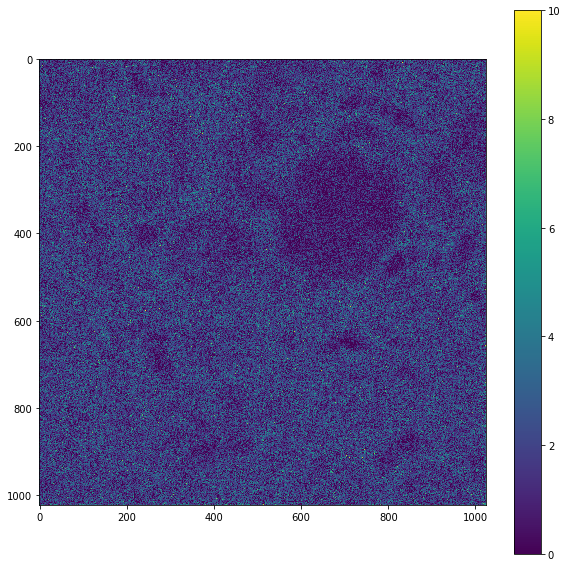

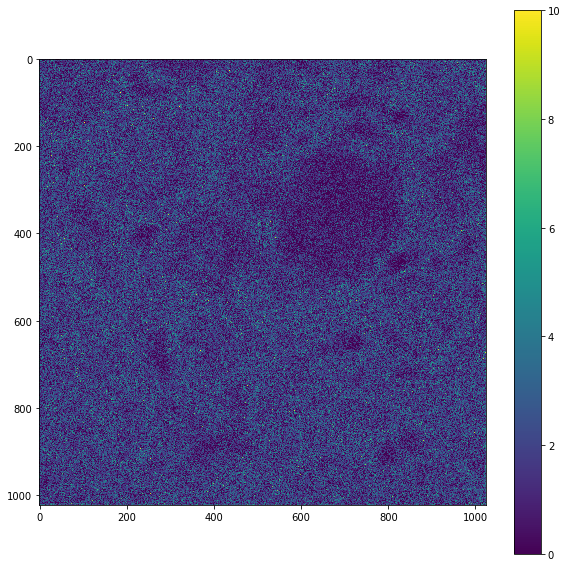

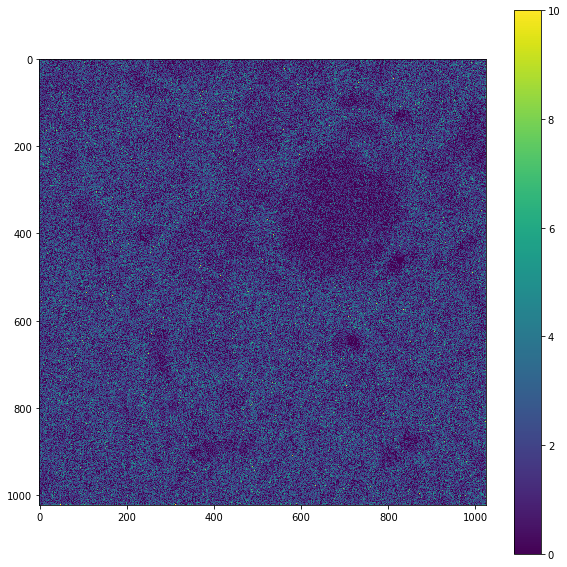

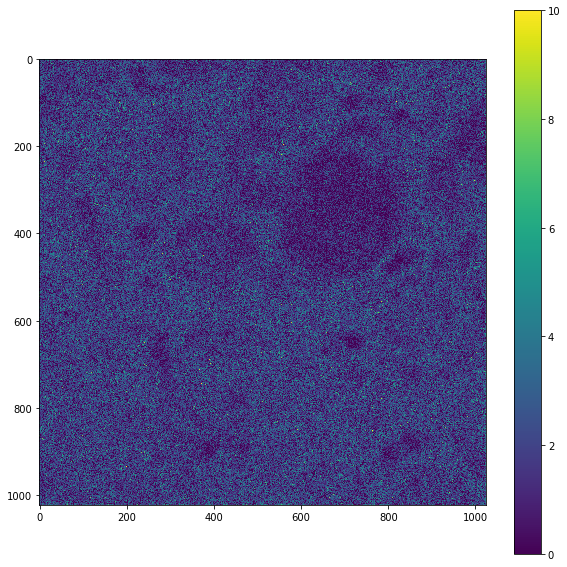

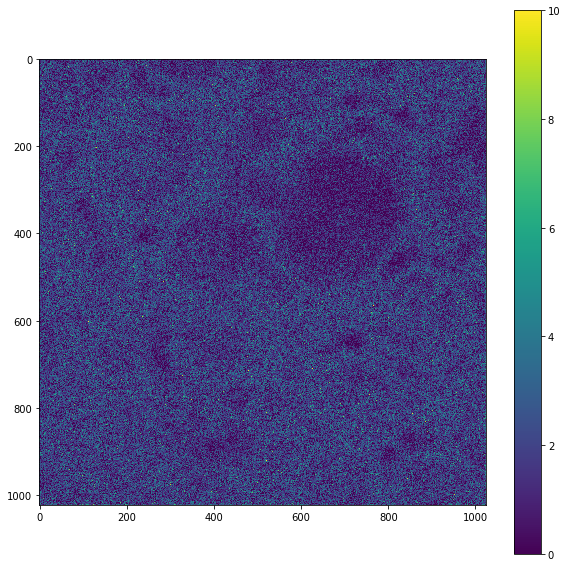

In [12]:
%matplotlib inline
df = 40
for i in range(0,df*5,df):
    view = np.zeros((nx,ny))
    for index in range(i,i+df):
        a = d[index].toarray()
        view = np.add(view, a)
    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(view, vmax=10)
    fig.colorbar(im)
    plt.show()

In [2]:
def plot_for_offset(power, y_max):
    # Data for plotting
    t = np.arange(0.0, 100, 1)
    s = t**power

    fig, ax = plt.subplots(figsize=(10,5))
    ax.plot(t, s)
    ax.grid()
    ax.set(xlabel='X', ylabel='x^{}'.format(power),
           title='Powers of x')

    # IMPORTANT ANIMATION CODE HERE
    # Used to keep the limits constant
    ax.set_ylim(0, y_max)

    # Used to return the plot as an image rray
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

kwargs_write = {'fps':1.0, 'quantizer':'nq'}
imageio.mimsave('./powers.gif', [plot_for_offset(i/4, 100) for i in range(10)], fps=1)

In [15]:
f_count = 0
m_count = 0
for index in range(np.max(list(d.keys()))):
    if index in d:
        f_count += 1
    else:
        m_count += 1
print(f_count, m_count)
print(np.max(list(d.keys())))

33010 2755
35765


In [15]:
def plot_frame(d, start, fractionation, nx, ny):
    # Data for plotting
    view = np.zeros((nx,ny))
    for index in range(start,start+fractionation):
        if index in d:
            view = np.add(view, d[index].toarray())
        else:
            print('Missing Frame: ' + str(index))

    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(view, vmax=500)
    fig.colorbar(im)
    ax.set(title='Sum of ' + str(fractionation) + ' L1 Reduced Frames Starting from: ' + str(start))

    # Used to return the plot as an image rray
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

kwargs_write = {'fps':30.0, 'quantizer':'nq'}
imageio.mimsave('./gold_nano_2.gif', [plot_frame(d,i,20,nx,ny) for i in range(0,6000,20)], fps=30)
plt.close("all")

/usr/local/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [6]:
plt.close("all")

In [27]:
def plot_frame(d, start, fractionation, nx, ny, frame_rate, pixel_size):
    # Data for plotting
    view = np.zeros((nx,ny))
    for index in range(start,start+fractionation):
        if index in d:
            view = np.add(view, d[index].toarray())
        else:
            print('Missing Frame: ' + str(index))

    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(view, vmax=500)
    fig.colorbar(im)
    _title_str = 'Gold particles on Carbon Grid mounted on EM-21010 Single Tilt Holder\n'
    _title_str += 'Time = {0:.3f} seconds'
    _title_str = _title_str.format(1.*start/frame_rate)
    ax.set(title=_title_str)
    
    _x_ticks =  [i for i in range(0,nx+1,200)]
    _y_ticks =  [i for i in range(0,ny+1,200)]
    _x_labels = ['{0:0.2f}'.format(pixel_size*i) for i in range(0,nx+1,200)]
    _y_labels = ['{0:0.2f}'.format(pixel_size*i) for i in range(0,ny+1,200)]
    
    ax.set_xticks(_x_ticks)
    ax.set_xticklabels(_x_labels)
    ax.set_xlabel('nm')
    
    ax.set_yticks(_y_ticks)
    ax.set_yticklabels(_y_labels)
    ax.set_xlabel('nm')
    ax.set_ylabel('nm')

    # Used to return the plot as an image rray
    plt.tight_layout()
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

kwargs_write = {'fps':60.0, 'quantizer':'nq'}
imageio.mimsave('./gold_nano_2.gif', [plot_frame(d,i,20,nx,ny,600,(1.02/5)/10) for i in range(0,6000,20)], fps=60)
plt.close("all")

/usr/local/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [24]:
(1.02/5)/10

0.0204

In [24]:
def plot_frames(
    d, src='sparse_dict', frame_rate=-1, pixel_size=-1, fractionation=1, 
    start=0, reps=1, title=None, vmax_ptile=90, 
    fft=False, fft_type='fft_of_sum_frames', nx_fft=256, ny_fft=256,
    show_plot=True, figsize=(20,10), savepath=None, dpi=600):
    
    assert src in ['seq', 'sparse_dict'], 'Unknown src'
    
    if src == 'seq':
        a = d[0]
    elif src == 'sparse_dict':
        a = d[0].toarray()
    
    df = fractionation
    nx, ny = a.shape
    Nf = reps
    
    if fft:
        assert fft_type in ['fft_of_sum_frames','sum_of_ffts'], 'Unknown param value for fft_tpye'
        ry = int(ny_fft/2)
        rx = int(nx_fft/2)
        
    assert show_plot or savepath is not None, 'Either show_plot or savepath must be selected'
    
    for i in range(start,start+(df*Nf),df):
        
        view = np.zeros((nx,ny))
        part_view = np.zeros((nx,ny))
        if fft:
            sum_ffts = np.zeros((ny_fft,nx_fft))
            
        for index in range(i,i+df):
            
            if src == 'seq':
                a = d[index]
            elif src == 'sparse_dict':
                a = d[index].toarray()
            
            view = np.add(view, a)
            part_view = np.add(part_view, a)
            
            if fft and fft_type == 'sum_of_ffts':
                if ny_fft < ny:
                    # cy = np.random.randint(ry,ny-ry)
                    cy = int(ny_fft/2)
                else:
                    cy = int(ny_fft/2)
                
                if nx_fft < nx:
                    # cx = np.random.randint(rx,nx-rx)
                    cx = int(nx_fft/2)
                else:
                    cx = int(nx_fft/2)
                    
                if index%30 == 0:
                    part_view = np.zeros((nx,ny))
                    
                sum_ffts = np.add(sum_ffts, 
                             np.abs(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(
                                 part_view[cy-ry:cy+ry,cx-rx:cx+rx])))))
                
        if i == start:
            _vmax = np.percentile(view,vmax_ptile)

        if fft:
            fig, axs = plt.subplots(nrows=1, ncols=2, figsize=figsize)
            ax = axs[0]
        else:
            fig, ax = plt.subplots(figsize=figsize)
            
        im = ax.imshow(view, vmin=np.min(view), vmax=_vmax)
        
        _title_str = ''
        if title is not None:
            _title_str += title
        if frame_rate > -1:
            timestamp = 'Time = {0:.3f} to {1:.3f} seconds ({2:d} frames)'.format(1.*i/frame_rate, 1.*(i+df)/frame_rate, df)
            _title_str += '\n' + timestamp
        
        dose_rate = np.sum(view)/(nx*1.0*ny*1.0*df)
        dr = 'Dose Rate for Dataset = {0:0.4f} e/p/f'.format(dose_rate)
        fd = 'Dose in Frame = {0:0.4f} e/p/f'.format(dose_rate*fractionation)
        td = 'Total Dose Suffered at the Start of Frame = {0:.3f} e/p'.format(i*dose_rate)
        _title_str += '\n' + dr + '. ' + fd + '\n' + td
        
        ax.set_title(_title_str)

        if pixel_size > -1:
            _x_ticks =  [j for j in range(0,nx+1,200)]
            _y_ticks =  [j for j in range(0,ny+1,200)]
            _x_labels = ['{0:0.2f}'.format(pixel_size*j) for j in range(0,nx+1,200)]
            _y_labels = ['{0:0.2f}'.format(pixel_size*j) for j in range(0,ny+1,200)]

            ax.set_xticks(_x_ticks)
            ax.set_xticklabels(_x_labels)
            ax.set_xlabel('nm')

            ax.set_yticks(_y_ticks)
            ax.set_yticklabels(_y_labels)
            ax.set_ylabel('nm')
        else:
            ax.set_xlabel('pixels')
            ax.set_ylabel('pixels')
            
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)
        cbar = fig.colorbar(im, cax=cax)

        if fft:
            if fft_type == 'fft_of_sum_frames':
                for bootstrap in range(100):
                    if ny_fft < ny:
                        cy = np.random.randint(ry,ny-ry)
                    else:
                        cy = int(ny_fft/2)

                    if nx_fft < nx:
                        cx = np.random.randint(rx,nx-rx)
                    else:
                        cx = int(nx_fft/2)
                    img = np.abs(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(view[cy-ry:cy+ry,cx-rx:cx+rx]))))
                    sum_ffts = np.add(sum_ffts,img)
            
            img_1 = np.log(sum_ffts)
            print(np.sum(np.logical_not(np.isinf(img_1))))
            img_1[np.isinf(img_1)] = np.max(img_1[np.logical_not(np.isinf(img_1))])
            
            im1 = axs[1].imshow(img_1, cmap='gray')
            
            if fft_type == 'fft_of_sum_frames':
                axs[1].set_title('FFT of Summed Frames')
            elif fft_type == 'sum_of_ffts':
                axs[1].set_title('Sum of FFTs')
            
            resolutions = (nx_fft/np.arange(-int(nx_fft/2),int(nx_fft/2)))*(pixel_size*10)
            _x_ticks_fft =  [j for j in range(0,ny_fft+1,int(ny_fft/10))]
            _y_ticks_fft =  [j for j in range(0,nx_fft+1,int(nx_fft/10))]
            _x_labels_fft = ['{0:0.2f}'.format(resolutions[j]) for j in range(0,nx_fft+1,int(nx_fft/10))]
            _y_labels_fft = ['{0:0.2f}'.format(resolutions[j]) for j in range(0,ny_fft+1,int(ny_fft/10))]

            axs[1].set_xticks(_x_ticks_fft)
            axs[1].set_xticklabels(_x_labels_fft)
            axs[1].set_xlabel('Resolution ($\AA$)')

            axs[1].set_yticks(_y_ticks_fft)
            axs[1].set_yticklabels(_y_labels_fft)
            axs[1].set_ylabel('Resolution ($\AA$)')
            
            divider = make_axes_locatable(axs[1])
            cax = divider.append_axes("right", size="5%", pad=0.1)
            cbar = fig.colorbar(im1, cax=cax)
            
        if savepath is not None:
            fig.savefig(savepath, dpi=dpi)
            
        if show_plot:
            plt.show()
            
        # plt.close()

In [3]:
_data_folder = '/scratch/loh/abhik/28-Feb-2010'
_datasets = [
    '300Kmag_300fps_NoCorrection_Lattice',
    '500Kmag_300fps_NoCorrection',
    '300Kmag_300fps_NoCorrection',
    '300Kmag_300fps_1',
    '200Kmag_300fps_NoCorrection',
    '120Kmag_300fps_NoCorrection',
    '120Kmag_300fps_LowerDose',
    '120Kmag_300fps_HigherDose',
    '200Kmag_300fps',
    '300Kmag_300fps_6_DeepInside',
    '300Kmag_300fps_5_HigherDose',
    '300Kmag_300fps_4_Edge',
    '300Kmag_300fps_3',
    '300Kmag_300fps_2']
data = {}

In [4]:
_magnifications = {}
_magnifications['300Kmag_300fps_NoCorrection_Lattice'] = 300
_magnifications['500Kmag_300fps_NoCorrection'] = 500
_magnifications['300Kmag_300fps_NoCorrection'] = 300
_magnifications['300Kmag_300fps_1'] = 300
_magnifications['200Kmag_300fps_NoCorrection'] = 200
_magnifications['120Kmag_300fps_NoCorrection'] = 120
_magnifications['120Kmag_300fps_LowerDose'] = 120
_magnifications['120Kmag_300fps_HigherDose'] = 120
_magnifications['200Kmag_300fps'] = 200
_magnifications['300Kmag_300fps_6_DeepInside'] = 300
_magnifications['300Kmag_300fps_5_HigherDose'] = 300
_magnifications['300Kmag_300fps_4_Edge'] = 300
_magnifications['300Kmag_300fps_3'] = 300
_magnifications['300Kmag_300fps_2'] = 300

65536


/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:137: RuntimeWarning: divide by zero encountered in true_divide


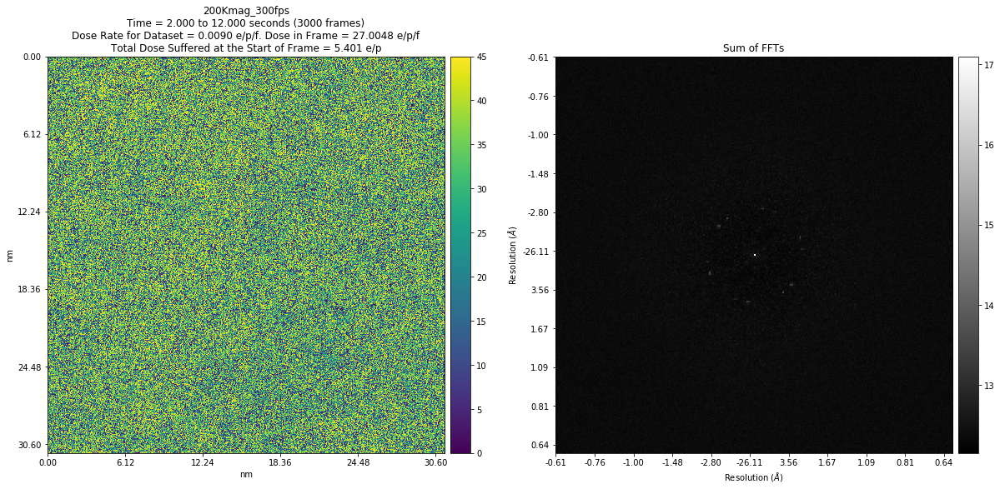

In [25]:
%matplotlib inline
dataset_index = 8
recode_level = 4
magnification = _magnifications[_datasets[dataset_index]]
_pixel_size = 0.102/(magnification/60)

fname = os.path.join(
    _data_folder, _datasets[dataset_index], _datasets[dataset_index] + '_4A_5.rc' + str(recode_level) + '.npy')

if fname not in data:
    x = np.load(fname)
    data[fname] = x.item()
    
plot_frames (
    data[fname], 
    src='sparse_dict',
    frame_rate=300, 
    pixel_size=_pixel_size, 
    fractionation=3000, 
    start=600, 
    reps=1, 
    title=_datasets[dataset_index],
    fft=True,
    fft_type='sum_of_ffts',
    nx_fft=256, 
    ny_fft=256,
    show_plot=False,
    savepath=os.path.join('/home/abhik/code/ReCoDe/scratch',_datasets[dataset_index]+'.png'))

/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:27: RuntimeWarning: divide by zero encountered in log


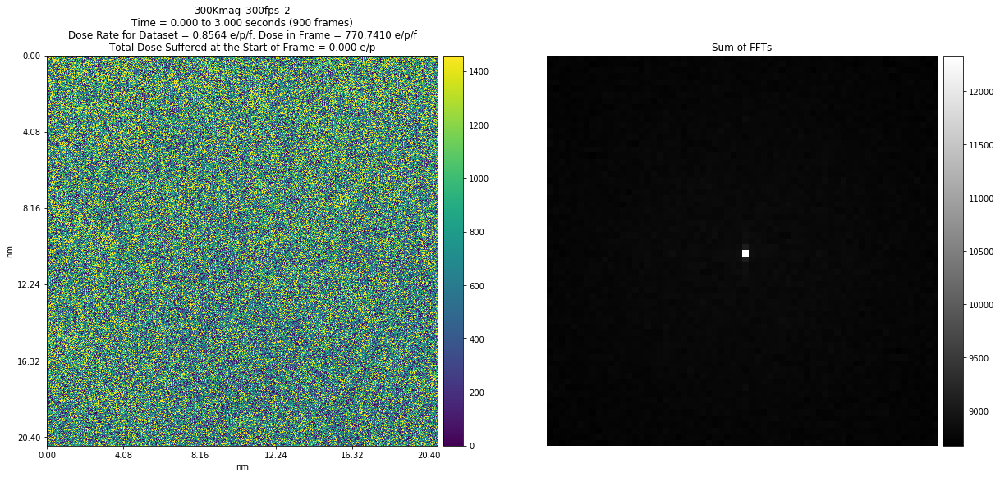

In [271]:
recode_level = 1
fname = os.path.join(
    _data_folder, _datasets[dataset_index], _datasets[dataset_index] + '_4A_5.rc' + str(recode_level) + '.npy')

if fname not in data:
    x = np.load(fname)
    data[fname] = x.item()
    
plot_frames (
    data[fname], 
    frame_rate=300, 
    pixel_size=_pixel_size, 
    fractionation=900, 
    start=0, 
    reps=1, 
    title=_datasets[dataset_index],
    fft=True,
    fft_type='sum_of_ffts',
    savepath=os.path.join('/home/abhik/code/ReCoDe/scratch',_datasets[dataset_index]+'.png'))

In [13]:
data_folder = '/scratch/loh/abhik/12_Feb_2020/darks'
_ref_3 = read_dark_ref(os.path.join(data_folder, '_dark_ref_3.bin'), (512,512), np.uint16)

In [55]:
a = [1,2,3,4,5]
print(a[-2])

4


In [152]:
ds = np.load('/home/abhik/code/ReCoDe/scratch/spectrum_moly.npy')
print(ds.shape)

(1024, 1024)


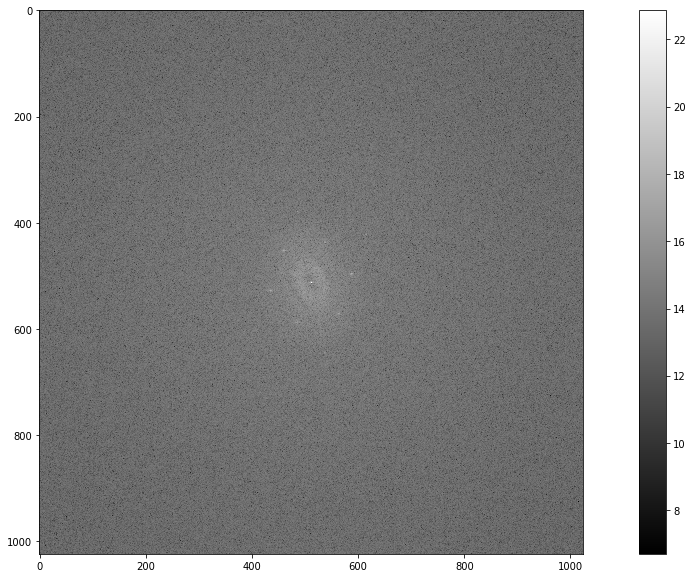

In [167]:
fig, ax = plt.subplots(figsize=(20,10))
im = ax.imshow(ds, cmap='gray')
fig.colorbar(im)
plt.show()

In [280]:
img_folder = "/home/abhik/code/ReCoDe/scratch"
Image(filename = os.path.join(img_folder, '300Kmag_300fps_2.png'), width=1400, height=1000)

In [66]:
def plot_fft(d, src='seq', frame_rate=-1, pixel_size=-1, fractionation=1, 
    start=0, nx_fft=256, ny_fft=256,
    show_plot=True, figsize=(20,10), savepath=None, dpi=600):
    
    assert src in ['seq', 'sparse_dict'], 'Unknown src'
    
    if src == 'seq':
        a = d[0]
    elif src == 'sparse_dict':
        a = d[0].toarray()
        
    nx, ny = a.shape
    
    ry = int(ny_fft/2)
    rx = int(nx_fft/2)
        
    assert show_plot or savepath is not None, 'Either show_plot or savepath must be selected'
    
    view = np.zeros((nx,ny))
    sum_ffts = np.zeros((ny_fft,nx_fft))
            
    for index in range(start,start+fractionation):
        
        if src == 'seq':
            a = d[index]
        elif src == 'sparse_dict':
            a = d[index].toarray()
        
        view = np.add(view, a)
        
        if ny_fft < ny:
            cy = np.random.randint(ry,ny-ry)
        else:
            cy = int(ny_fft/2)
                
        if nx_fft < nx:
            cx = np.random.randint(rx,nx-rx)
        else:
            cx = int(nx_fft/2)
                    
        sum_ffts = np.add(sum_ffts, 
                        np.log(np.abs(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(a[cy-ry:cy+ry,cx-rx:cx+rx])))))
                   )
        
        cx = int(nx_fft/2)
        cy = int(ny_fft/2)
        #sum_ffts[cy-2:cy+2,cx-2:cx+2] = 0
                
    img_1 = sum_ffts
    img_1[np.isinf(img_1)] = 0
    resolutions = (nx_fft/np.arange(-int(nx_fft/2),int(nx_fft/2)))*(pixel_size*10)
            
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=figsize)
        
    axs[0].imshow(view)
        
    im1 = axs[1].imshow(img_1, cmap='gray')
    axs[1].set_title('Sum of FFTs')
            
    _x_ticks_fft =  [j for j in range(0,ny_fft+1,int(ny_fft/10))]
    _y_ticks_fft =  [j for j in range(0,nx_fft+1,int(nx_fft/10))]
    _x_labels_fft = ['{0:0.2f}'.format(resolutions[j]) for j in range(0,nx_fft+1,int(nx_fft/10))]
    _y_labels_fft = ['{0:0.2f}'.format(resolutions[j]) for j in range(0,ny_fft+1,int(ny_fft/10))]
            
    axs[1].set_xticks(_x_ticks_fft)
    axs[1].set_xticklabels(_x_labels_fft)
    axs[1].set_xlabel('Resolution ($\AA$)')

    axs[1].set_yticks(_y_ticks_fft)
    axs[1].set_yticklabels(_y_labels_fft)
    axs[1].set_ylabel('Resolution ($\AA$)')
            
    divider = make_axes_locatable(axs[1])
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = fig.colorbar(im1, cax=cax)
        
    '''
    ticklabs = cbar.ax.get_yticklabels()
    cbar.ax[1].set_yticklabels(ticklabs, fontsize=32)
    '''
        
    if savepath is not None:
        fig.savefig(savepath, dpi=dpi)
            
    if show_plot:
        plt.show()

/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:51: RuntimeWarning: divide by zero encountered in true_divide


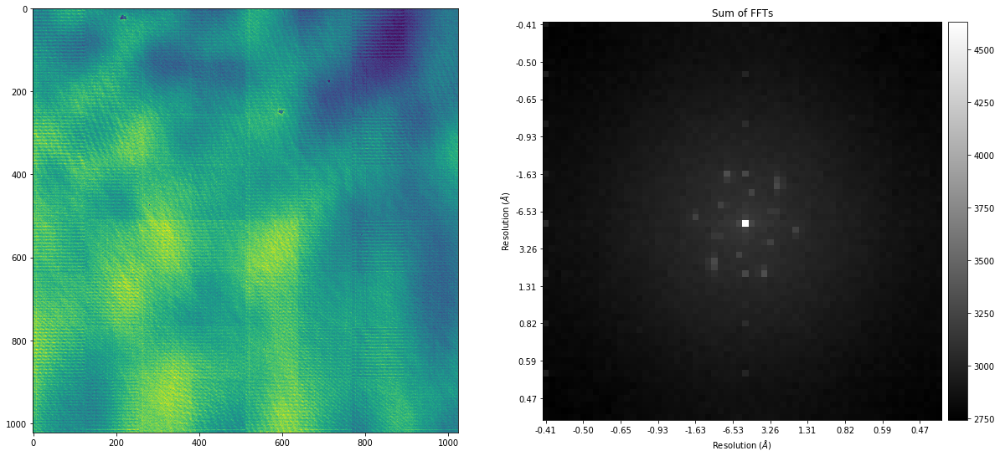

In [67]:
d = pims.open('/scratch/loh/abhik/28-Feb-2010/DE16/15-02-03.490_300kmag_30fps_MultiLayer.seq')
magnification = 300
_pixel_size = 0.102/(magnification/60)
plot_fft(d, 
         frame_rate=30, 
         pixel_size=_pixel_size, 
         fractionation=300, 
         start=0, 
         nx_fft=64, 
         ny_fft=64,
         show_plot=True, 
         figsize=(20,10), 
         savepath=None, 
         dpi=600)

/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:42: RuntimeWarning: divide by zero encountered in log
/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:51: RuntimeWarning: divide by zero encountered in true_divide


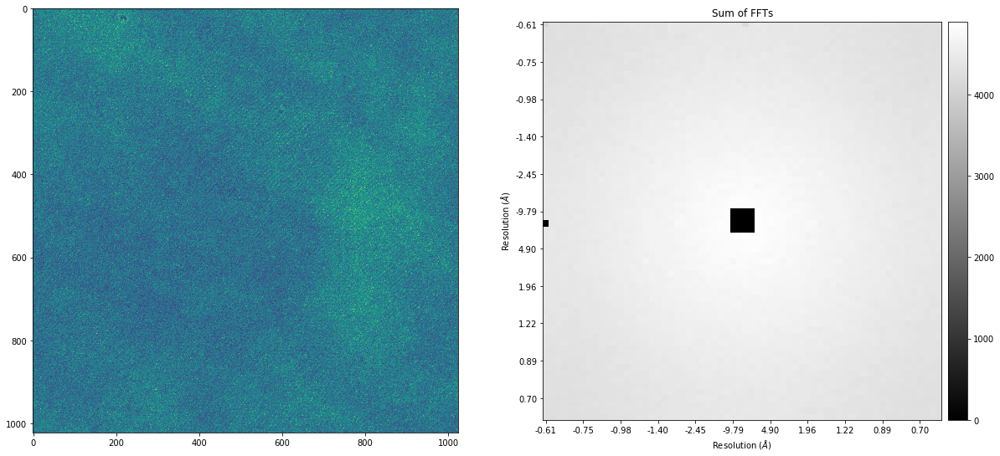

In [48]:
dataset_index = 4
recode_level = 1

fname = os.path.join(
    _data_folder, _datasets[dataset_index], _datasets[dataset_index] + '.rc' + str(recode_level) + '.npy')

if fname not in data:
    x = np.load(fname)
    data[fname] = x.item()

_pixel_size = 0.102/(_magnifications[_datasets[dataset_index]]/60)
plot_fft(data[fname], 
         src='sparse_dict',
         frame_rate=300, 
         pixel_size=_pixel_size, 
         fractionation=600, 
         start=600, 
         nx_fft=64, 
         ny_fft=64,
         show_plot=True, 
         figsize=(20,10), 
         savepath=None, 
         dpi=600)

In [11]:
print(fname)

/scratch/loh/abhik/28-Feb-2010/200Kmag_300fps/200Kmag_300fps_4A_5.rc4.npy


65536


/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:137: RuntimeWarning: divide by zero encountered in true_divide


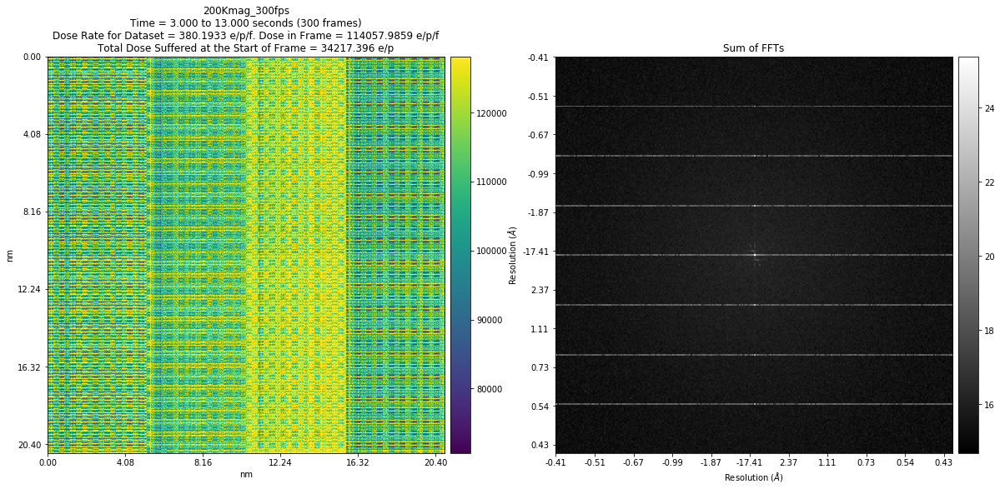

In [30]:
_tag = '15-14-47.435_300Kmag_30fps_MaxDose'
d = pims.open('/scratch/loh/abhik/28-Feb-2010/DE16/' + _tag + '.seq')
magnification = 300
_pixel_size = 0.102/(magnification/60)

plot_frames (
    d, 
    src='seq',
    frame_rate=30, 
    pixel_size=_pixel_size, 
    fractionation=300, 
    start=90, 
    reps=1, 
    title=_datasets[dataset_index],
    fft=True,
    fft_type='sum_of_ffts',
    nx_fft=256, 
    ny_fft=256,
    show_plot=False,
    savepath=os.path.join('/home/abhik/code/ReCoDe/scratch', _tag + '.png'))